In [0]:
%pip install s3fs
%pip install sentence-transformers
%pip install wordcloud

Python interpreter will be restarted.
  Using cached s3fs-2023.3.0-py3-none-any.whl (27 kB)
  Using cached aiohttp-3.8.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.0 MB)
  Using cached fsspec-2023.3.0-py3-none-any.whl (145 kB)
  Using cached aiobotocore-2.4.2-py3-none-any.whl (66 kB)
  Using cached aioitertools-0.11.0-py3-none-any.whl (23 kB)
  Using cached botocore-1.27.59-py3-none-any.whl (9.1 MB)
  Using cached frozenlist-1.3.3-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (158 kB)
  Using cached yarl-1.8.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (264 kB)
  Using cached async_timeout-4.0.2-py3-none-any.whl (5.8 kB)
  Using cached aiosignal-1.3.1-py3-none-any.whl (7.6 kB)
  Using cached multidict-6.0.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (114 kB)
  Attempting uninstall: botocore
    Found existing installation: botocore 1.24.32
    Not uninstalling botocore at /databricks/python3/

In [0]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans

import matplotlib.pyplot as plt

# Data Prep

In [0]:
df = pd.read_csv(".../control_fg_tp.csv", header=0)

In [0]:
df = df[df["source"] == "fieldguide"]
df.head()

,org_id,control,framework_section_code,framework_section_title,source,control_category,control_sub_category,control_shortname,control_processed,gensim_topics,gensim_topic_tp1,gensim_tp1_topic_id,gensim_tp1_topic_prob,gensim_tp1_topic_keywords,gensim_tp0_prob,gensim_tp1_prob,gensim_tp2_prob,gensim_tp3_prob,gensim_tp4_prob,gensim_tp5_prob,gensim_tp6_prob,gensim_tp7_prob,gensim_tp8_prob,gensim_tp9_prob,gensim_tp10_prob,gensim_tp11_prob
0,1.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4699, 'top...","{'topic_index': 7, 'topic_prob': 0.4699, 'topi...",7,0.4699,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4543,0.0,0.0,0.4699,0.0000,0.0,0.0000,0.0
1,1.0,defines availability monitoring alert criteri...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,defines availability monitoring alert criteri...,"[{'topic_index': 10, 'topic_prob': 0.57, 'topi...","{'topic_index': 10, 'topic_prob': 0.57, 'topic...",10,0.5700,data_privacy_information_personal_third_partie...,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0000,0.3745,0.0,0.5700,0.0
2,10.0,defines availability monitoring alert criteri...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,defines availability monitoring alert criteri...,"[{'topic_index': 10, 'topic_prob': 0.5698, 'to...","{'topic_index': 10, 'topic_prob': 0.5698, 'top...",10,0.5698,data_privacy_information_personal_third_partie...,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0000,0.3746,0.0,0.5698,0.0
3,10.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4699, 'top...","{'topic_index': 7, 'topic_prob': 0.4699, 'topi...",7,0.4699,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4543,0.0,0.0,0.4699,0.0000,0.0,0.0000,0.0
4,136.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4698, 'top...","{'topic_index': 7, 'topic_prob': 0.4698, 'topi...",7,0.4698,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4544,0.0,0.0,0.4698,0.0000,0.0,0.0000,0.0


In [0]:
import re
def standardize_redaction(text):
    res_text = re.sub('XXX+', '[The organization]', text)
    res_text = re.sub('AAA+', '[The organization]', res_text)
    res_text = re.sub('\[The organization\]', '[The organization]'.upper(), res_text)
    return res_text

print(df[df['control'].apply(lambda x: "XXXXXXXX" in x)]['control'].count())
print(df[df['control'].apply(lambda x: "AAAAAAAA" in x)]['control'].count())

df['control_processed'] = df['control'].apply(standardize_redaction)

# Remove punctuation
df['control_processed'] = df['control_processed'].map(lambda x: re.sub('[,\.!?]', '', x))

0
0


In [0]:
df.head()

,org_id,control,framework_section_code,framework_section_title,source,control_category,control_sub_category,control_shortname,control_processed,gensim_topics,gensim_topic_tp1,gensim_tp1_topic_id,gensim_tp1_topic_prob,gensim_tp1_topic_keywords,gensim_tp0_prob,gensim_tp1_prob,gensim_tp2_prob,gensim_tp3_prob,gensim_tp4_prob,gensim_tp5_prob,gensim_tp6_prob,gensim_tp7_prob,gensim_tp8_prob,gensim_tp9_prob,gensim_tp10_prob,gensim_tp11_prob
0,1.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4699, 'top...","{'topic_index': 7, 'topic_prob': 0.4699, 'topi...",7,0.4699,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4543,0.0,0.0,0.4699,0.0000,0.0,0.0000,0.0
1,1.0,defines availability monitoring alert criteri...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,defines availability monitoring alert criteri...,"[{'topic_index': 10, 'topic_prob': 0.57, 'topi...","{'topic_index': 10, 'topic_prob': 0.57, 'topic...",10,0.5700,data_privacy_information_personal_third_partie...,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0000,0.3745,0.0,0.5700,0.0
2,10.0,defines availability monitoring alert criteri...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,defines availability monitoring alert criteri...,"[{'topic_index': 10, 'topic_prob': 0.5698, 'to...","{'topic_index': 10, 'topic_prob': 0.5698, 'top...",10,0.5698,data_privacy_information_personal_third_partie...,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0000,0.3746,0.0,0.5698,0.0
3,10.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4699, 'top...","{'topic_index': 7, 'topic_prob': 0.4699, 'topi...",7,0.4699,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4543,0.0,0.0,0.4699,0.0000,0.0,0.0000,0.0
4,136.0,performs a risk assessment to determine the d...,A1.1,"The entity maintains, monitors, and evaluates ...",fieldguide,NaN,NaN,NaN,performs a risk assessment to determine the d...,"[{'topic_index': 7, 'topic_prob': 0.4698, 'top...","{'topic_index': 7, 'topic_prob': 0.4698, 'topi...",7,0.4698,documented_security_policy_event_communicated_...,0.0,0.0,0.0,0.0,0.4544,0.0,0.0,0.4698,0.0000,0.0,0.0000,0.0


# Kmeans with TFIDF

In [0]:
# TF-IDF Feature Generation
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer

from sklearn.cluster import KMeans

# Vectorize document using Count
vect = CountVectorizer(min_df=20, max_df=0.9, stop_words='english', token_pattern='(?u)\\b\\w\\w\\w+\\b')
corpus = vect.fit_transform(df['control_processed'])


# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
tf_idf_vect = TfidfVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1),
                        tokenizer = tokenizer.tokenize)
# Fit and Transfrom Text Data
tfidf_corpus = tf_idf_vect.fit_transform(df['control_processed'])

# Check Shape of Count Vector
tfidf_corpus.shape, tfidf_corpus

Out[7]: ((49442, 7154),
 <49442x7154 sparse matrix of type '<class 'numpy.float64'>'
 	with 688910 stored elements in Compressed Sparse Row format>)

In [0]:
# kmeans = KMeans(n_clusters=10, random_state=42)
# kmeans.fit(corpus)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fd66bfc9550>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callba

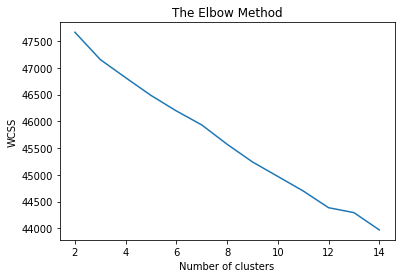

In [0]:
MAX_NUM_CLUSTERS = 15
def tuning(max_num_clusters, tfidf_corpus):
    models = []
    for i in range(2, max_num_clusters):
        kmeans = KMeans(n_clusters=i, random_state=42)
        kmeans.fit(tfidf_corpus)
        models.append([i, kmeans, kmeans.inertia_])
    return models

def plot_wcss_for_elbow_method(MAX_NUM_CLUSTERS, wccs):
    plt.plot(range(2, MAX_NUM_CLUSTERS), wccs, markersize=5, marker="o")
    plt.title('The Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    # plt.savefig('elbow.png')
    plt.show()

    
candidate_models = tuning(MAX_NUM_CLUSTERS, tfidf_corpus)
plot_wcss_for_elbow_method(MAX_NUM_CLUSTERS, [i[2] for i in candidate_models])

In [0]:
candidate_models

Out[10]: [[2, KMeans(n_clusters=2, random_state=42), 47665.03497104297],
 [3, KMeans(n_clusters=3, random_state=42), 47154.85030051407],
 [4, KMeans(n_clusters=4, random_state=42), 46816.18453367472],
 [5, KMeans(n_clusters=5, random_state=42), 46484.49360459903],
 [6, KMeans(n_clusters=6, random_state=42), 46194.686735768075],
 [7, KMeans(n_clusters=7, random_state=42), 45933.635638234446],
 [8, KMeans(random_state=42), 45572.28432246312],
 [9, KMeans(n_clusters=9, random_state=42), 45242.27969370691],
 [10, KMeans(n_clusters=10, random_state=42), 44971.104074397066],
 [11, KMeans(n_clusters=11, random_state=42), 44699.59810130355],
 [12, KMeans(n_clusters=12, random_state=42), 44387.06365225854],
 [13, KMeans(n_clusters=13, random_state=42), 44295.02798283999],
 [14, KMeans(n_clusters=14, random_state=42), 43971.92489986424]]

In [0]:
best_kmean_tfidf_idx = 10 # note this is the index not num clusters
print(candidate_models[best_kmean_tfidf_idx][0])
best_kmean_tfidf = candidate_models[best_kmean_tfidf_idx][1]

df["tfidf_cluster_id"] = best_kmean_tfidf.labels_

12


In [0]:
# from sklearn import metrics
# metrics.silhouette_score(tfidf_corpus.todense(), best_kmean_tfidf.labels_ , metric='euclidean')

/databricks/python/lib/python3.9/site-packages/sklearn/utils/validation.py:593: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [0]:
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
from sklearn.decomposition import PCA

def visualization_cluster_2D(kmeans_model, tfidf_corpus):
    pca_2 = PCA(2)
    pca_2_result = pca_2.fit_transform(tfidf_corpus)
    
    x = pca_2_result[:, 0]
    y = pca_2_result[:, 1]
    predicted_labels = kmeans_model.labels_
    
    centroids = kmeans_model.cluster_centers_
    centroids_pca = pca_2.transform(centroids)
    
    fig, ax = plt.subplots(figsize=(6, 6))
    scatter=ax.scatter(x=x, y=y, c=predicted_labels, cmap="spring", lw=0.1, alpha=0.8)
    ax.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c="black", marker='x',s=169, linewidths=3, zorder=10,lw=3,)
    ax.legend(*scatter.legend_elements(), loc="upper right", title="Cluster")
    
    fig.show()

def visualization_cluster_3D(kmeans_model, tfidf_corpus):
    pca_3 = PCA(3)
    pca_3_result = pca_3.fit_transform(tfidf_corpus)

    x = pca_3_result[:, 0]
    y = pca_3_result[:, 1]
    z = pca_3_result[:, 2]
    helper_df = pd.DataFrame({"x": x, "y": y,"z": z,"cluster_id": kmeans_model.labels_})
    
    num_clusters = kmeans_model.n_clusters
    
    centroids = kmeans_model.cluster_centers_
    centroids_pca = pca_3.transform(centroids)
    
    Scene = dict(xaxis = dict(title  = 'PC1 -->'),yaxis = dict(title  = 'PC2--->'),zaxis = dict(title  = 'PC3-->'))
    
    # Add each cluster group
    traces = []
    for i in range(num_clusters):
        data = helper_df[helper_df["cluster_id"]==i]
        trace = go.Scatter3d(
            x=data["x"], y=data["y"], z=data["z"], mode='markers', marker=dict( color = i, size= 5, line=dict(color= 'black',width = 10) ), name=f"cluster-{i}", opacity=0.2
        )
        # Add cluster centorid
        trace_cent = go.Scatter3d(
            x=[centroids_pca[:, 0][i]], y=[centroids_pca[:, 1][i]], z=[centroids_pca[:, 2][i]], mode='markers', 
            marker=dict(color = i, size= 20, line=dict(color= 'black',width = 10)), name=f"cluster-{i}-centorid"
        )
        
        traces.append(trace)
        traces.append(trace_cent)
    
    layout = go.Layout(margin=dict(l=0,r=0), scene = Scene,height = 800,width = 800)
    fig = go.Figure(data = traces, layout = layout)
    fig.show()

/databricks/python/lib/python3.9/site-packages/sklearn/utils/validation.py:593: FutureWarning:

np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html



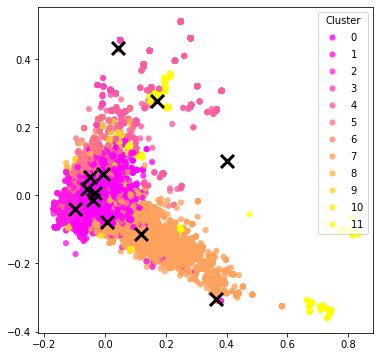

In [0]:
visualization_cluster_2D(best_kmean_tfidf, tfidf_corpus.todense()) # best_kmean_tfidf, tfidf_corpus

In [0]:
import pickle 
import s3fs
s3 = s3fs.S3FileSystem()

with s3.open(f".../best_kmeans_tfidf_{best_kmean_tfidf.n_clusters}", 'wb') as f:
    pickle.dump(best_kmean_tfidf, f)
    
# infile = s3.open(f".../best_kmeans_tfidf_{best_kmean_tfidf.n_clusters}", 'rb')
# m = pickle.load(infile)

In [0]:
visualization_cluster_3D(best_kmean_tfidf, tfidf_corpus.todense())

/databricks/python/lib/python3.9/site-packages/sklearn/utils/validation.py:593: FutureWarning:

np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html



In [0]:
# View examples
voc = tf_idf_vect.get_feature_names()
common_words = best_kmean_tfidf.cluster_centers_.argsort()[:,-1:-26:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + ' : ' + ', '.join(voc[word] for word in centroid))
    
    
# cluster_assignment = kmeans.labels_
# clustered_sentences = [[] for i in range(10)]
# for sentence_id, cluster_id in enumerate(cluster_assignment):
#     clustered_sentences[cluster_id].append(corpus[sentence_id])
# for i, cluster in enumerate(clustered_sentences):
#     print("Cluster ", i+1)
#     print(cluster[:5])
#     print("")

0 : data, security, management, s, changes, software, procedures, company, change, policies, policy, systems, business, network, requirements, responsibilities, personnel, monitoring, job, internal, place, annually, configured, ensure, employees
1 : access, authorized, personnel, production, termination, logical, systems, user, required, restricted, revoked, authentication, longer, based, factor, approval, role, management, environment, users, requires, provisioning, appropriate, implemented, changes
2 : prepares, findi, manage, formally, remediation, resolution, plan, activities, identified, assessment, risk, management, vulnerability, penetration, scans, test, scanning, reputable, instance, scan, testing, conducted, tests, party, based
3 : prioritization, align, meeting, periodic, resource, leader, communicate, staff, security, program, conducts, threats, performance, relevant, defined, organization, management, vp, meeti, daily, officer, summarized, triage, tasks, manager
4 : organi

# Sentence BERT

In [0]:
embedder = SentenceTransformer('distilbert-base-nli-stsb-mean-tokens', device=0)

Downloading:   0%|          | 0.00/345 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.01k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/555 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/265M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/505 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

In [0]:
corpus = df["control_processed"].tolist()
corpus_embeddings = embedder.encode(corpus)
# kmeans = KMeans(n_clusters=8, n_init=10, random_state=42)
# kmeans.fit(corpus_embeddings)
# df["cluster_id"] = kmeans.labels_
# make prediction for one sentence kmeans.predict(embedder.encode([corpus[-1]]))

# Tuning

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fd5c40531f0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/databricks/python/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callba

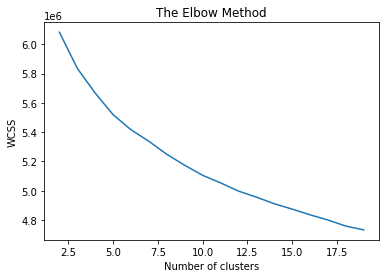

In [0]:
# MAX_NUM_CLUSTERS = 50
MAX_NUM_CLUSTERS = 20
candidate_models = tuning(MAX_NUM_CLUSTERS, corpus_embeddings)
plot_wcss_for_elbow_method(MAX_NUM_CLUSTERS, [i[2] for i in candidate_models])

In [0]:
best_kmean_bert_idx = 8 # note this is the index not num clusters
print(candidate_models[best_kmean_bert_idx][0])
best_kmean_bert = candidate_models[best_kmean_bert_idx][1]

df["cluster_id_bert"] = best_kmean_bert.labels_

10


In [0]:
with s3.open(f".../best_kmeans_bert_{best_kmean_bert.n_clusters}", 'wb') as f:
    pickle.dump(best_kmean_bert, f)

In [0]:
df.to_csv(".../control_fg_tp_km.csv", header=True, index=False)

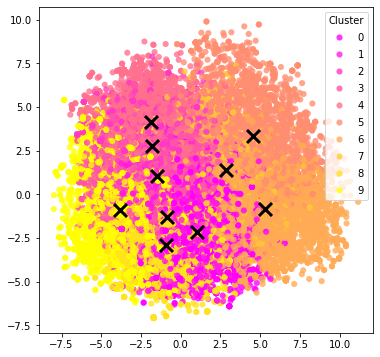

In [0]:
visualization_cluster_2D(best_kmean_bert, corpus_embeddings)

In [0]:
visualization_cluster_3D(best_kmean_bert, corpus_embeddings)

In [0]:
# View examples
cluster_assignment = best_kmean_bert.labels_
clustered_sentences = [[] for i in range(best_kmean_bert.n_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(corpus[sentence_id])
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    for i, c in enumerate(set(cluster[:3])):
        print(f"- {c.strip()}.")
    print("")

Cluster  1
- ensures availability for the production hardware with redundant power systems Alerts are generated if interruptions are detected.
- The monitoring application is configured to send notifications to facility management via e-mail when pre-defined thresholds are exceeded.
- Real time logging and alerting are enabled on network devices and logs are set to “informational” so anything at this level or above is logged Any significant alerts are documented and formally evaluated using incident handling procedures.

Cluster  2
- defines availability monitoring alert criteria how alert criteria will be flagged and identifies authorized personnel for flagged system alerts.

Cluster  3
- IT management uses internal tools and monitoring tools to forecast trends and needs to support the decisions of Senior Managers and the needs of the business.
- Server event logs are monitored by  Managed Services employees Any significant alerts are documented and formally evaluated using incident h

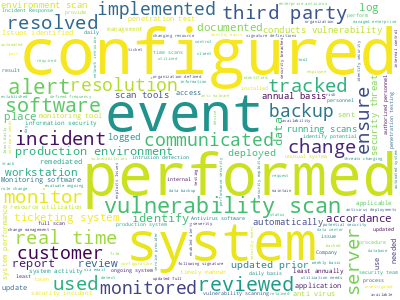

In [0]:
# View Wordclouds
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(clustered_sentences[0])
wordcloud = WordCloud(
    background_color="white", max_words=500, contour_width=3, contour_color='steelblue', width=400, height=300
)
wordcloud.generate(long_string)
display(wordcloud.to_image())